In [ ]:
# Needed::

import os
import json
import torch
import random
import numpy as np
import torchvision
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from PIL import Image, ImageFile
import matplotlib.patches as patches
from torchvision import transforms, models
# from torchvision.references.detection import engine
# from engine import train_one_epoch, evaluate
from torchvision.datasets import CocoDetection
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import FasterRCNN
from torchvision.transforms import v2 as transforms
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [ ]:
# Needed::

# Convert train annotations polygon dimensions(x_all, y_all) to COCO BBOX(x,y,w,h):

# Use below paths to handle train and val annotation files separately

train_annotations = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Train_via_annos.json'
train_dset = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image'

val_annotations = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Val_via_annos.json'
val_dset = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation'

# 1. Define CLASSES (same as your training)
CLASSES = {
    'mat_bo_phan': 1,  # COCO uses 1-based IDs
    'rach': 2,
    'mop_lom': 3,
    'tray_son': 4,
    'thung': 5,
    'vo_kinh': 6,
    'be_den': 7
}

# 2. Polygon to COCO BBOX Conversion (returns x_min, y_min, width, height)
def polygon_to_coco_bbox(all_x, all_y):
    """Convert polygon to COCO format [x_min, y_min, width, height] in pixels"""
    x_min = min(all_x)
    y_min = min(all_y)
    width = max(all_x) - x_min
    height = max(all_y) - y_min
    return x_min, y_min, width, height  # Explicit return for debugging

# 3. Process Annotations

# Update annotations file below::
with open(train_annotations) as f:
    annotations = json.load(f)

coco_format = {
    "images": [],
    "annotations": [],
    "categories": [{"id": id, "name": name} for name, id in CLASSES.items()]
}

annotation_id = 1
for img_id, (img_name, img_data) in enumerate(annotations.items(), start=1):

# Update dataset path below::
    img_path = os.path.join(train_dset, img_name)
    
    # Get image dimensions
    with Image.open(img_path) as img:
        width, height = img.size
    
    # Add image info
    coco_format["images"].append({
        "id": img_id,
        "file_name": img_name,
        "width": width,
        "height": height
    })
    
    # Process each polygon
    for region in img_data['regions']:
        x_min, y_min, w, h = polygon_to_coco_bbox(region['all_x'], region['all_y'])
        
        coco_format["annotations"].append({
            "id": annotation_id,
            "image_id": img_id,
            "category_id": CLASSES[region['class']],
            "bbox": [x_min, y_min, w, h],  # COCO format
            "area": w * h,
            "iscrowd": 0
        })
        annotation_id += 1

# Save COCO format

# Update output filename here
with open('train_coco.json', 'w') as f:
    json.dump(coco_format, f, indent=2)

print(f"Generated {len(coco_format['annotations'])} COCO annotations.")
print(f"Sample bbox: {coco_format['annotations'][0]['bbox']}")  # Verify first bbox

Generated 30046 COCO annotations.
Sample bbox: [1, 1, 446, 577]


In [ ]:
# Needed::

# Convert val annotations polygon dimensions(x_all, y_all) to COCO BBOX(x,y,w,h):

# Use below paths to handle train and val annotation files separately

train_annotations = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Train_via_annos.json'
train_dset = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image'

val_annotations = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Val_via_annos.json'
val_dset = '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation'

# 1. Define CLASSES (same as your training)
CLASSES = {
    'mat_bo_phan': 1,  # COCO uses 1-based IDs
    'rach': 2,
    'mop_lom': 3,
    'tray_son': 4,
    'thung': 5,
    'vo_kinh': 6,
    'be_den': 7
}

# 2. Polygon to COCO BBOX Conversion (returns x_min, y_min, width, height)
def polygon_to_coco_bbox(all_x, all_y):
    """Convert polygon to COCO format [x_min, y_min, width, height] in pixels"""
    x_min = min(all_x)
    y_min = min(all_y)
    width = max(all_x) - x_min
    height = max(all_y) - y_min
    return x_min, y_min, width, height  # Explicit return for debugging

# 3. Process Annotations

# Update annotations file below::
with open(val_annotations) as f:
    annotations = json.load(f)

coco_format = {
    "images": [],
    "annotations": [],
    "categories": [{"id": id, "name": name} for name, id in CLASSES.items()]
}

annotation_id = 1
for img_id, (img_name, img_data) in enumerate(annotations.items(), start=1):

# Update dataset path below::
    img_path = os.path.join(val_dset, img_name)
    
    # Get image dimensions
    with Image.open(img_path) as img:
        width, height = img.size
    
    # Add image info
    coco_format["images"].append({
        "id": img_id,
        "file_name": img_name,
        "width": width,
        "height": height
    })
    
    # Process each polygon
    for region in img_data['regions']:
        x_min, y_min, w, h = polygon_to_coco_bbox(region['all_x'], region['all_y'])
        
        coco_format["annotations"].append({
            "id": annotation_id,
            "image_id": img_id,
            "category_id": CLASSES[region['class']],
            "bbox": [x_min, y_min, w, h],  # COCO format
            "area": w * h,
            "iscrowd": 0
        })
        annotation_id += 1

# Save COCO format

# Update output filename here
with open('val_coco.json', 'w') as f:
    json.dump(coco_format, f, indent=2)

print(f"Generated {len(coco_format['annotations'])} COCO annotations.")
print(f"Sample bbox: {coco_format['annotations'][0]['bbox']}")  # Verify first bbox

Generated 6035 COCO annotations.
Sample bbox: [839, 565, 325, 219]


In [ ]:
# Needed::

# --- Config ---
BATCH_SIZE = 32
LR = 0.001
EPOCHS = 10
IMG_SIZE = (224, 224)
CLASSES = {
    'mat_bo_phan': 0,
    'rach': 1,
    'mop_lom': 2,
    'tray_son': 3,
    'thung': 4,
    'vo_kinh': 5,
    'be_den': 6
}

# --- Dataset for COCO format ---
class VehicleDamageCOCODataset(Dataset):
    def __init__(self, img_dir, annotations_file, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        
        with open(annotations_file) as f:
            self.coco_data = json.load(f)
        
        # Create mapping from image_id to image info
        self.id_to_image = {img['id']: img for img in self.coco_data['images']}
        
        # Group annotations by image_id
        self.annotations = {}
        for ann in self.coco_data['annotations']:
            img_id = ann['image_id']
            if img_id not in self.annotations:
                self.annotations[img_id] = []
            self.annotations[img_id].append(ann)
        
        # Filter valid images
        self.valid_ids = []
        self.missing_count = 0
        
        for img_id, img_info in self.id_to_image.items():
            img_path = os.path.join(img_dir, img_info['file_name'])
            if os.path.exists(img_path):
                try:
                    with Image.open(img_path) as img:
                        img.verify()
                    self.valid_ids.append(img_id)
                except:
                    self.missing_count += 1
            else:
                self.missing_count += 1
        
        print(f"Found {len(self.valid_ids)} valid images | Skipped {self.missing_count} files")

    def __len__(self):
        return len(self.valid_ids)
    
    def __getitem__(self, idx):
        img_id = self.valid_ids[idx]
        img_info = self.id_to_image[img_id]
        img_path = os.path.join(self.img_dir, img_info['file_name'])
        
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            return self[random.randint(0, len(self)-1)]  # Fallback
            
        # Multi-label target
        target = torch.zeros(len(CLASSES), dtype=torch.float32)
        if img_id in self.annotations:
            for ann in self.annotations[img_id]:
                class_name = self.coco_data['categories'][ann['category_id']-1]['name']
                if class_name in CLASSES:
                    target[CLASSES[class_name]] = 1.0
                
        if self.transform:
            image = self.transform(image)
            
        return image, target

# --- Transforms ---
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [ ]:
# Needed::

# --- Data ---
train_data = VehicleDamageCOCODataset(
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image',
    '/kaggle/working/train_coco.json',  # Your generated COCO file
    transform
)
val_data = VehicleDamageCOCODataset(
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation',
    '/kaggle/working/val_coco.json',  # Your generated COCO file
    transform
)

Found 11621 valid images | Skipped 0 files
Found 2324 valid images | Skipped 0 files



Training set samples:


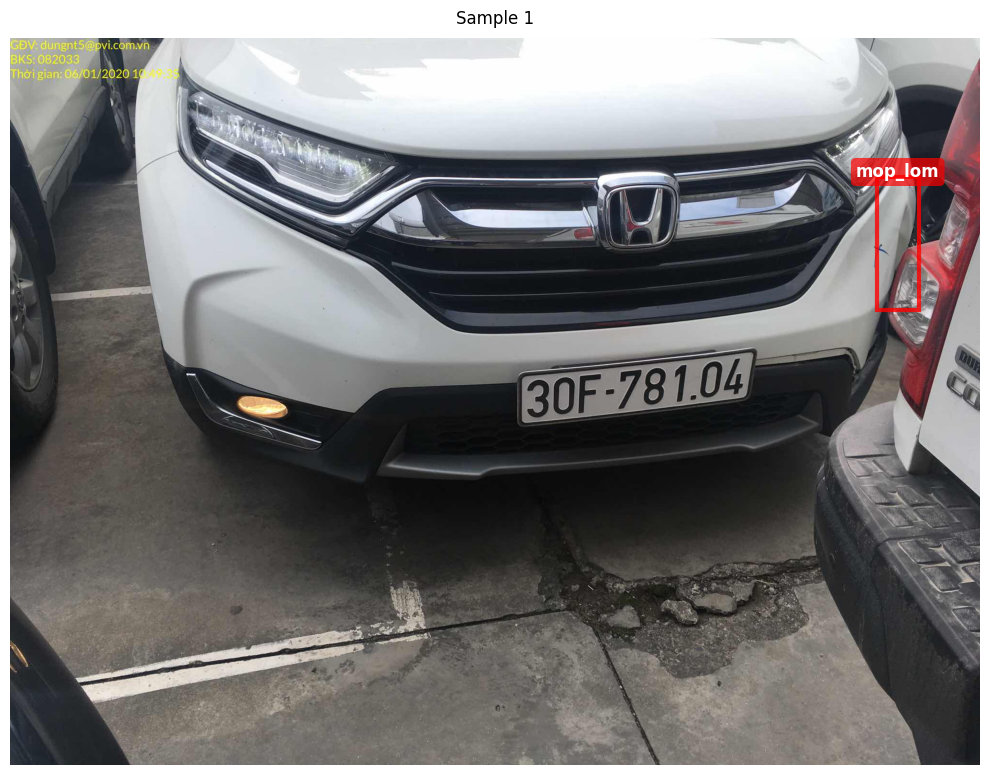

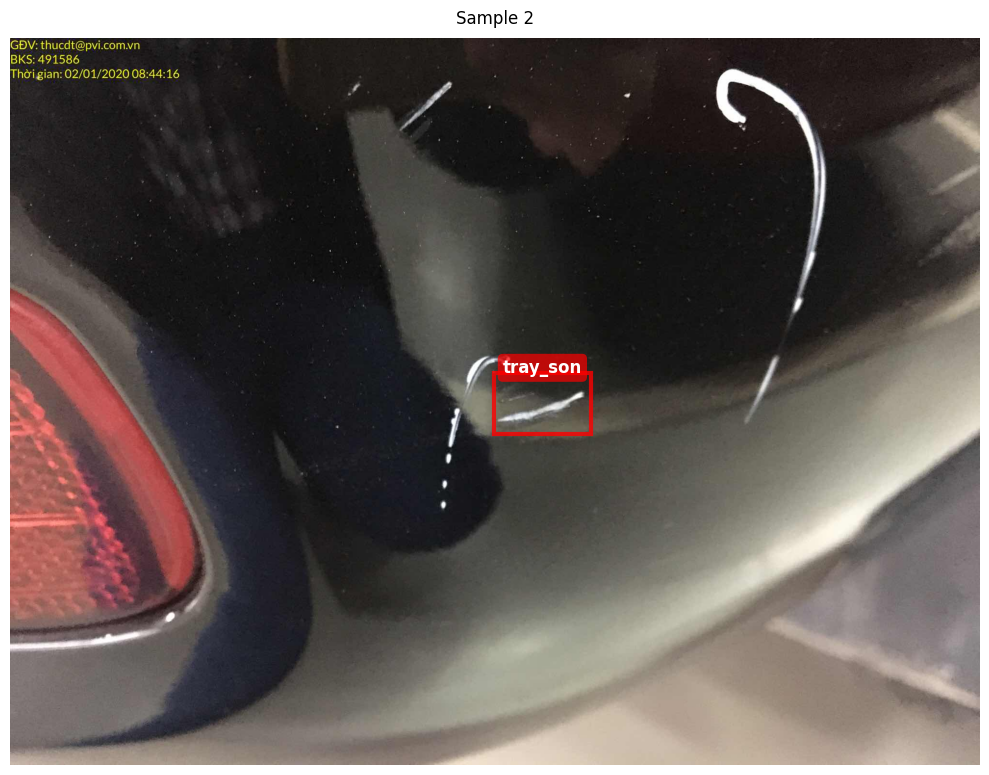

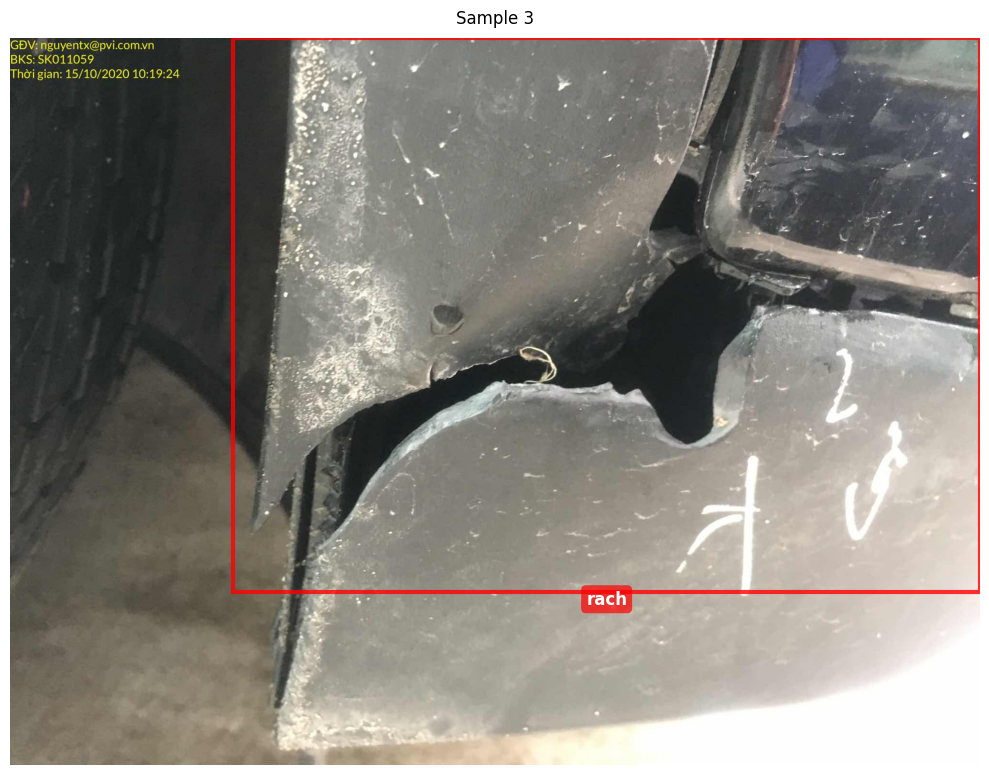


Validation set samples:


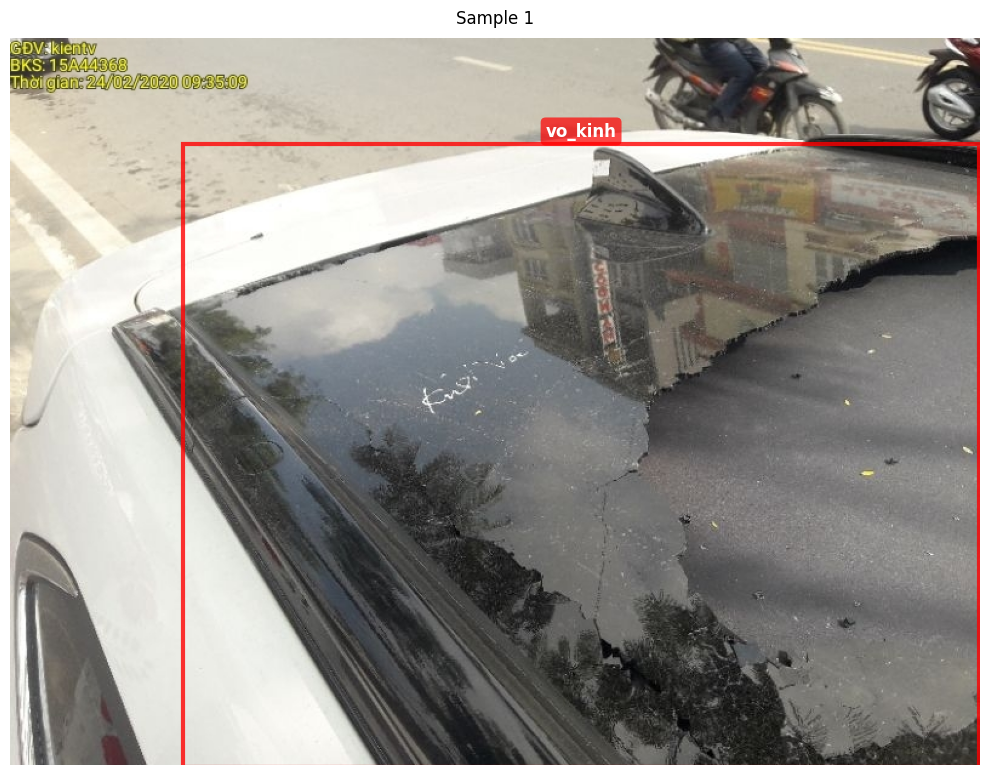

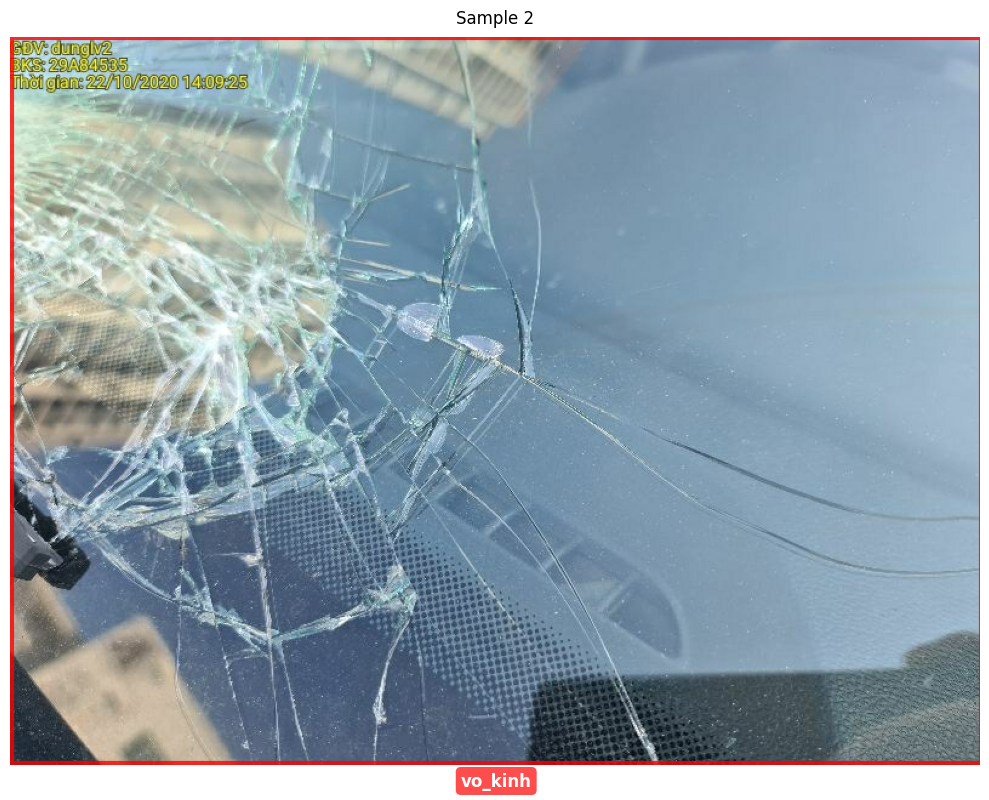

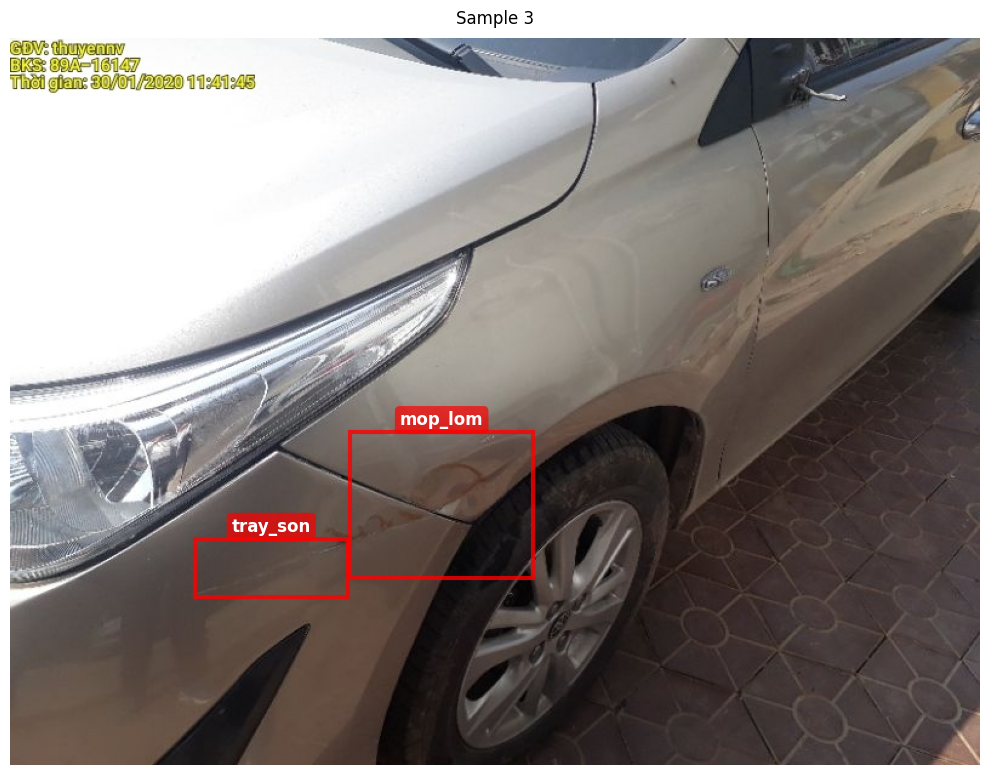

In [ ]:
# Needed::

def visualize_samples(dataset, num_samples=1):
    for i in range(num_samples):
        # Get random sample
        idx = random.randint(0, len(dataset)-1)
        image_tensor, _ = dataset[idx]
        
        # Convert tensor to numpy and unnormalize
        image = image_tensor.numpy().transpose(1, 2, 0)
        image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)
        
        # Get original image to match coordinates
        img_id = dataset.valid_ids[idx]
        img_info = dataset.id_to_image[img_id]
        original_img = Image.open(os.path.join(dataset.img_dir, img_info['file_name']))
        orig_width, orig_height = original_img.size
        
        # Calculate scaling factors
        scale_x = orig_width / image.shape[1]
        scale_y = orig_height / image.shape[0]
        
        # Create figure
        plt.figure(figsize=(10, 10))
        plt.imshow(original_img)  # Show original image
        plt.axis('off')
        
        # Get annotations
        annotations = dataset.annotations.get(img_id, [])
        
        # Track drawn labels to avoid duplicates
        drawn_labels = set()
        
        for ann in annotations:
            # Get original coordinates
            x, y, w, h = ann['bbox']
            class_name = dataset.coco_data['categories'][ann['category_id']-1]['name']
            
            # Skip if we've already drawn this label
            if class_name in drawn_labels:
                continue
            drawn_labels.add(class_name)
            
            # Draw bounding box
            rect = patches.Rectangle(
                (x, y), w, h,
                linewidth=3,
                edgecolor='red',
                facecolor='none',
                alpha=0.8
            )
            plt.gca().add_patch(rect)
            
            # Calculate text position (top center of box)
            text_x = x + w/2
            text_y = y - 10 if y > 30 else y + h + 15
            
            # Draw single label per damage type
            plt.text(
                text_x, text_y, class_name,
                color='white',
                fontsize=12,
                weight='bold',
                ha='center',
                va='center',
                bbox=dict(
                    facecolor='red',
                    alpha=0.7,
                    boxstyle='round,pad=0.3',
                    edgecolor='none'
                )
            )
        
        plt.title(f"Sample {i+1}", pad=10)
        plt.tight_layout()
        plt.show()

# Usage
print("\nTraining set samples:")
visualize_samples(train_data, num_samples=3)

print("\nValidation set samples:")
visualize_samples(val_data, num_samples=3)

In [ ]:
# Not needed::

# DamageNet with TPU::

import os
import json
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import random
import torch_xla
import torch_xla.core.xla_model as xm
from torch_xla.distributed.parallel_loader import ParallelLoader

# --- Device Setup for TPU ---
device = xm.xla_device()
print(f"Using device: {device}")

# --- Configuration ---
BATCH_SIZE = 32
LR = 0.0001
EPOCHS = 10
CLASSES = ['mat_bo_phan', 'rach', 'mop_lom', 'tray_son', 'thung', 'vo_kinh', 'be_den']
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASSES)}

# --- Custom Dataset ---
class VehicleDamageDataset(Dataset):
    def __init__(self, img_dir, annotations_file, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        with open(annotations_file) as f:
            self.annotations = json.load(f)
        self.valid_images = [img for img in self.annotations if os.path.exists(os.path.join(img_dir, img))]

    def __len__(self):
        return len(self.valid_images)

    def __getitem__(self, idx):
        img_name = self.valid_images[idx]
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert('RGB')

        target = torch.zeros(len(CLASSES), dtype=torch.float32)
        for region in self.annotations[img_name].get('regions', []):
            class_name = region['class']
            if class_name in CLASS_TO_IDX:
                target[CLASS_TO_IDX[class_name]] = 1.0

        if self.transform:
            image = self.transform(image)
        return image, target

# --- Transforms ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# --- Data Loaders ---
train_dataset = VehicleDamageDataset(
    '/path/to/train/images',
    '/path/to/train_annotations.json',
    transform=transform
)

val_dataset = VehicleDamageDataset(
    '/path/to/val/images',
    '/path/to/val_annotations.json',
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, num_workers=4)

# --- DamageNet Model ---
class DamageNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.base = models.resnet50(weights='DEFAULT')
        in_features = self.base.fc.in_features
        self.base.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.base(x)

model = DamageNet(len(CLASSES)).to(device)

# --- Training Setup ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2)

# --- Training Loop (TPU-Aware) ---
best_val_loss = float('inf')
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    train_loader_xla = ParallelLoader(train_loader, [device]).per_device_loader(device)

    for images, labels in train_loader_xla:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        xm.optimizer_step(optimizer)
        optimizer.zero_grad()
        train_loss += loss.item()

    model.eval()
    val_loss = 0.0
    correct = 0
    val_loader_xla = ParallelLoader(val_loader, [device]).per_device_loader(device)

    with torch.no_grad():
        for images, labels in val_loader_xla:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            val_loss += criterion(outputs, labels).item()
            preds = torch.sigmoid(outputs) > 0.5
            correct += (preds == labels.bool()).all(dim=1).sum().item()

    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    val_acc = correct / len(val_dataset)
    scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        xm.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'class_to_idx': CLASS_TO_IDX,
            'val_loss': val_loss
        }, '/kaggle/working/best_damage_model_tpu.pth')

    print(f"Epoch {epoch+1}/{EPOCHS} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.2e}")

print("Training complete on TPU!")


In [ ]:
# Needed::

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader
import numpy as np
from PIL import Image
import os
import random

# --- Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# --- Configuration ---
BATCH_SIZE = 32
LR = 0.0001
EPOCHS = 10
CLASSES = ['mat_bo_phan', 'rach', 'mop_lom', 'tray_son', 'thung', 'vo_kinh', 'be_den']
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASSES)}  # Create class to index mapping

# --- Dataset Class (Fixed) ---
class VehicleDamageDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, annotations_file, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        
        with open(annotations_file) as f:
            self.annotations = json.load(f)
        
        self.valid_images = []
        self.missing_count = 0
        
        for img_name in self.annotations.keys():
            img_path = os.path.join(img_dir, img_name)
            if os.path.exists(img_path):
                try:
                    with Image.open(img_path) as img:
                        img.verify()
                    self.valid_images.append(img_name)
                except:
                    self.missing_count += 1
            else:
                self.missing_count += 1
        
        print(f"Found {len(self.valid_images)} valid images | Skipped {self.missing_count} files")

    def __len__(self):
        return len(self.valid_images)
    
    def __getitem__(self, idx):
        img_name = self.valid_images[idx]
        img_path = os.path.join(self.img_dir, img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            return self[random.randint(0, len(self)-1)]  # Fallback
            
        # Multi-label target - FIXED: Use CLASS_TO_IDX instead of CLASSES
        target = torch.zeros(len(CLASSES), dtype=torch.float32)
        for region in self.annotations[img_name].get('regions', []):
            class_name = region['class']
            if class_name in CLASS_TO_IDX:
                target[CLASS_TO_IDX[class_name]] = 1.0  # Use integer index
                
        if self.transform:
            image = self.transform(image)
            
        return image, target

# --- Transforms ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Standard size for ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# --- Data Loaders ---
train_data = VehicleDamageDataset(
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image',
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Train_via_annos.json',
    transform
)
val_data = VehicleDamageDataset(
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation',
    '/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Val_via_annos.json',
    transform
)

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_data, batch_size=BATCH_SIZE, num_workers=4)

# --- Enhanced Model ---
class DamageNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.base = models.resnet50(weights='DEFAULT')
        in_features = self.base.fc.in_features
        self.base.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        return self.base(x)

model = DamageNet(len(CLASSES)).to(device)

# --- Training Setup ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2)

# --- Training Loop ---
best_val_loss = float('inf')
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    model.eval()
    val_loss = 0.0
    correct = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            val_loss += criterion(outputs, labels.float()).item()
            
            preds = torch.sigmoid(outputs) > 0.5
            correct += (preds == labels.bool()).all(dim=1).sum().item()
    
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    val_acc = correct / len(val_data)
    
    scheduler.step(val_loss)
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'model_state_dict': model.state_dict(),
            'class_to_idx': CLASS_TO_IDX,
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
        }, '/kaggle/working/best_damage_model.pth')
    
    print(f'Epoch {epoch+1}/{EPOCHS} | '
          f'Train Loss: {train_loss:.4f} | '
          f'Val Loss: {val_loss:.4f} | '
          f'Val Acc: {val_acc:.4f} | '
          f'LR: {optimizer.param_groups[0]["lr"]:.2e}')

print("Training complete!")

Using device: cuda
Found 11621 valid images | Skipped 0 files
Found 2324 valid images | Skipped 0 files


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 201MB/s]


Epoch 1/10 | Train Loss: 0.3809 | Val Loss: 0.3117 | Val Acc: 0.4161 | LR: 1.00e-04
Epoch 2/10 | Train Loss: 0.2559 | Val Loss: 0.2919 | Val Acc: 0.4630 | LR: 1.00e-04
Epoch 3/10 | Train Loss: 0.1684 | Val Loss: 0.3154 | Val Acc: 0.4591 | LR: 1.00e-04
Epoch 4/10 | Train Loss: 0.1084 | Val Loss: 0.3632 | Val Acc: 0.4759 | LR: 1.00e-04
Epoch 5/10 | Train Loss: 0.0715 | Val Loss: 0.4119 | Val Acc: 0.4729 | LR: 1.00e-05
Epoch 6/10 | Train Loss: 0.0399 | Val Loss: 0.3950 | Val Acc: 0.4892 | LR: 1.00e-05
Epoch 7/10 | Train Loss: 0.0265 | Val Loss: 0.4087 | Val Acc: 0.4849 | LR: 1.00e-05
Epoch 8/10 | Train Loss: 0.0208 | Val Loss: 0.4136 | Val Acc: 0.4935 | LR: 1.00e-06
Epoch 9/10 | Train Loss: 0.0156 | Val Loss: 0.4264 | Val Acc: 0.4957 | LR: 1.00e-06
Epoch 10/10 | Train Loss: 0.0150 | Val Loss: 0.4218 | Val Acc: 0.4978 | LR: 1.00e-06
Training complete!


<ipython-input-8-edc80c4594ea>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODEL_PATH, map_location=device) #For TPU


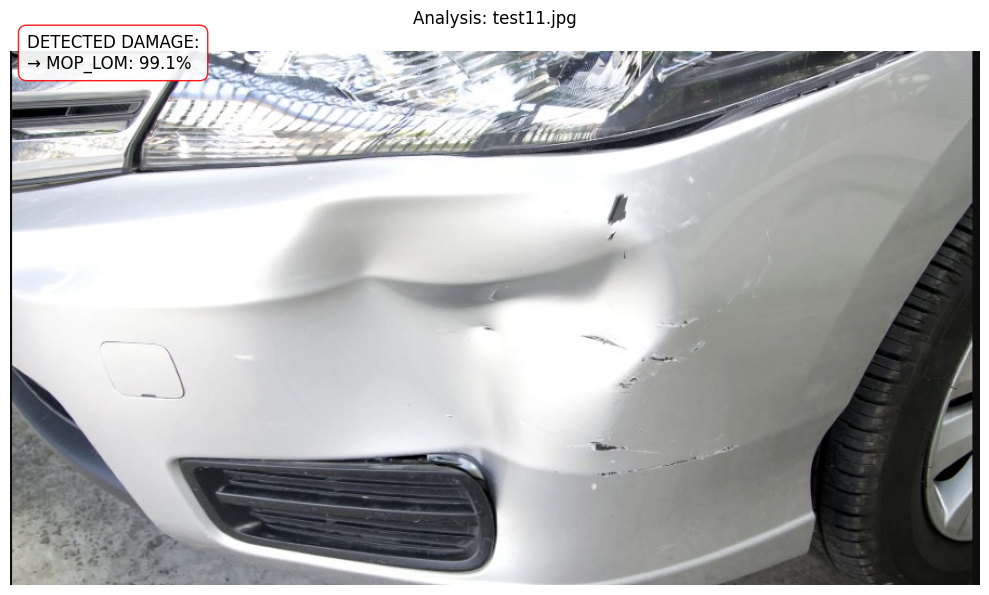


IMAGE: test11.jpg
DAMAGE FOUND:
- MOP_LOM: 99.1% confidence


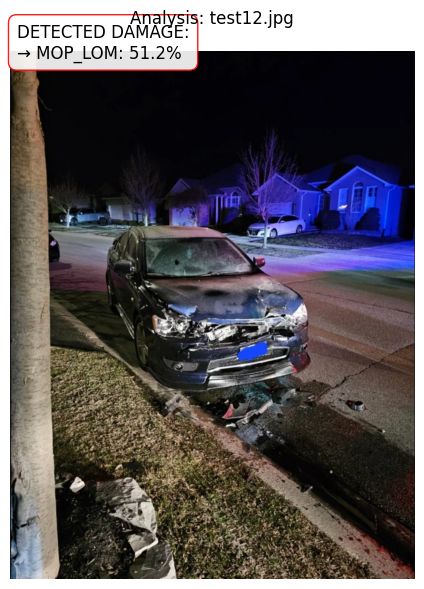


IMAGE: test12.jpg
DAMAGE FOUND:
- MOP_LOM: 51.2% confidence


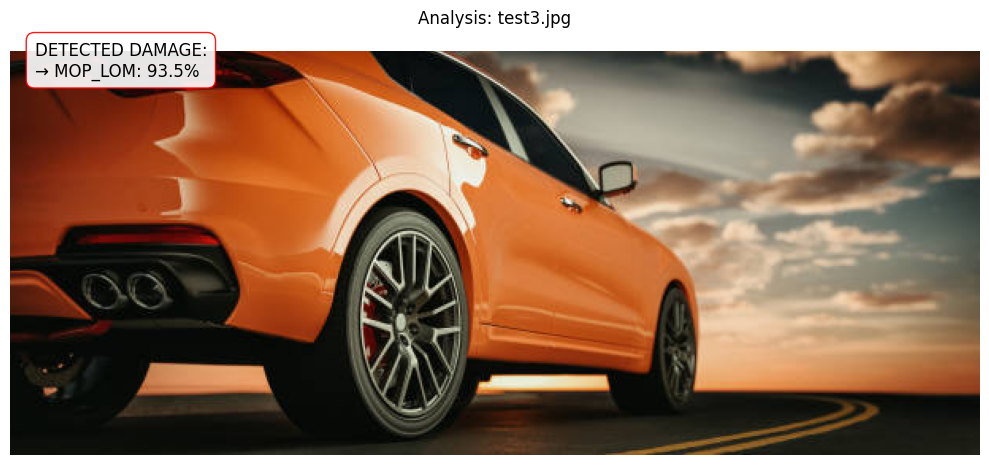


IMAGE: test3.jpg
DAMAGE FOUND:
- MOP_LOM: 93.5% confidence


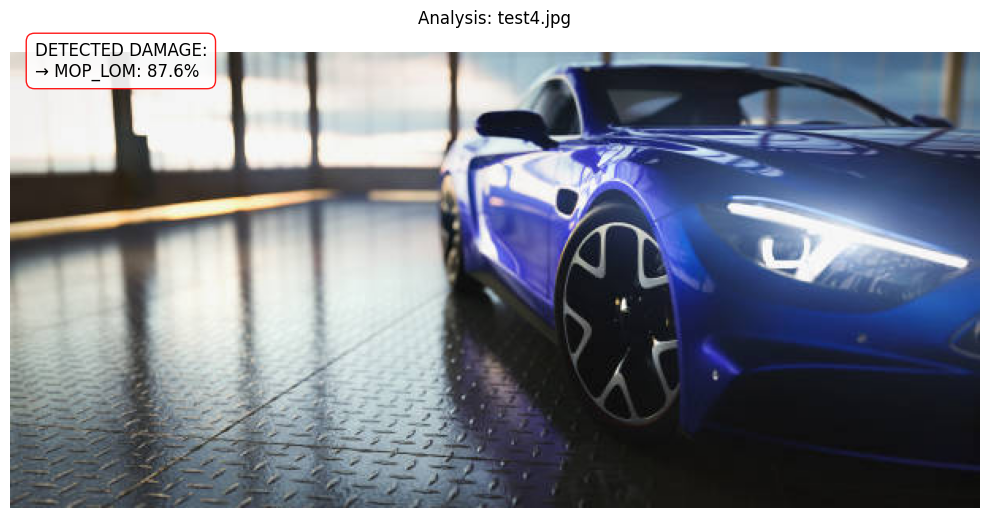


IMAGE: test4.jpg
DAMAGE FOUND:
- MOP_LOM: 87.6% confidence


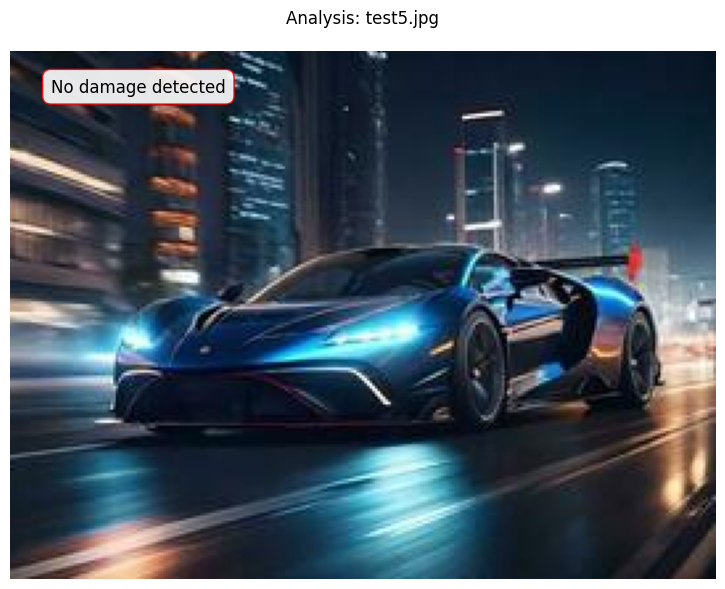


IMAGE: test5.jpg
STATUS: No significant damage detected


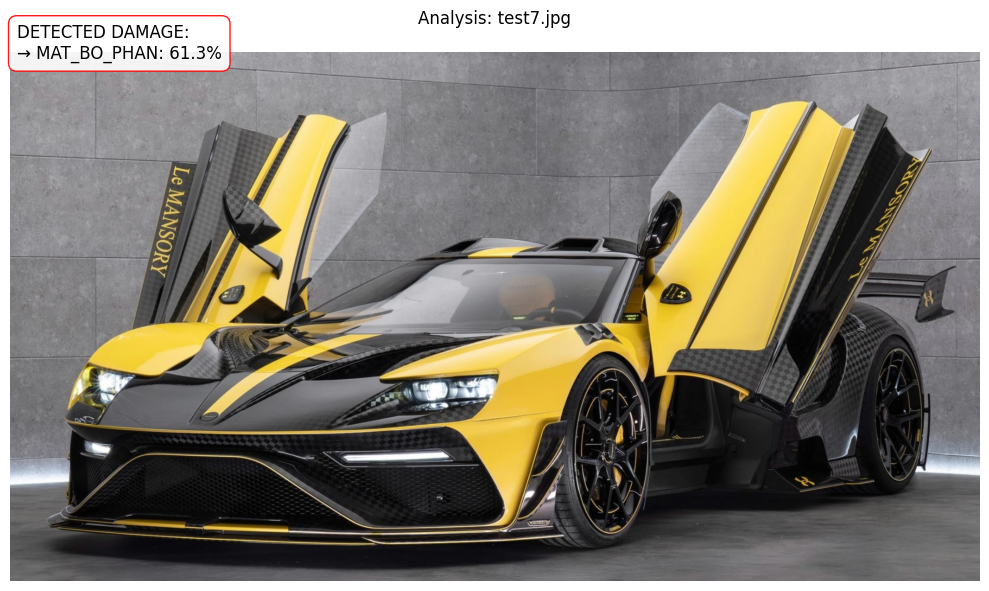


IMAGE: test7.jpg
DAMAGE FOUND:
- MAT_BO_PHAN: 61.3% confidence


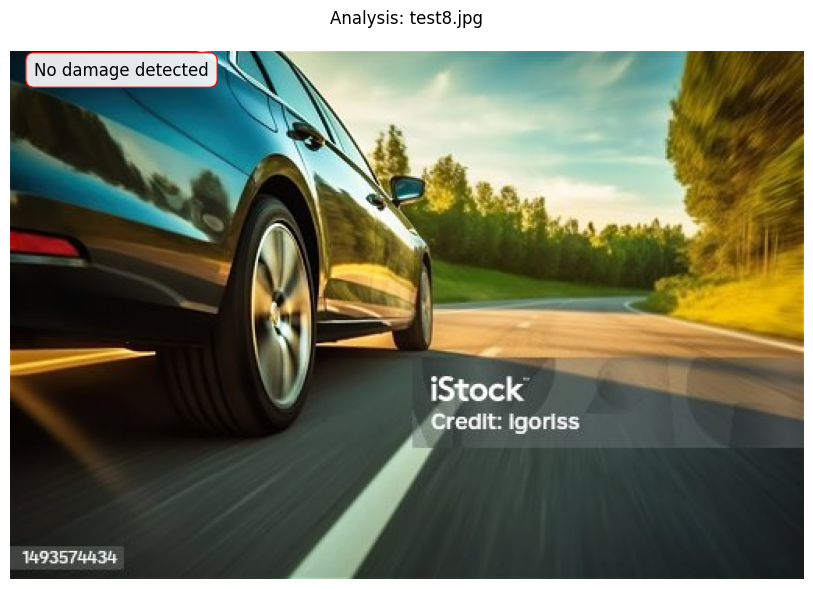


IMAGE: test8.jpg
STATUS: No significant damage detected


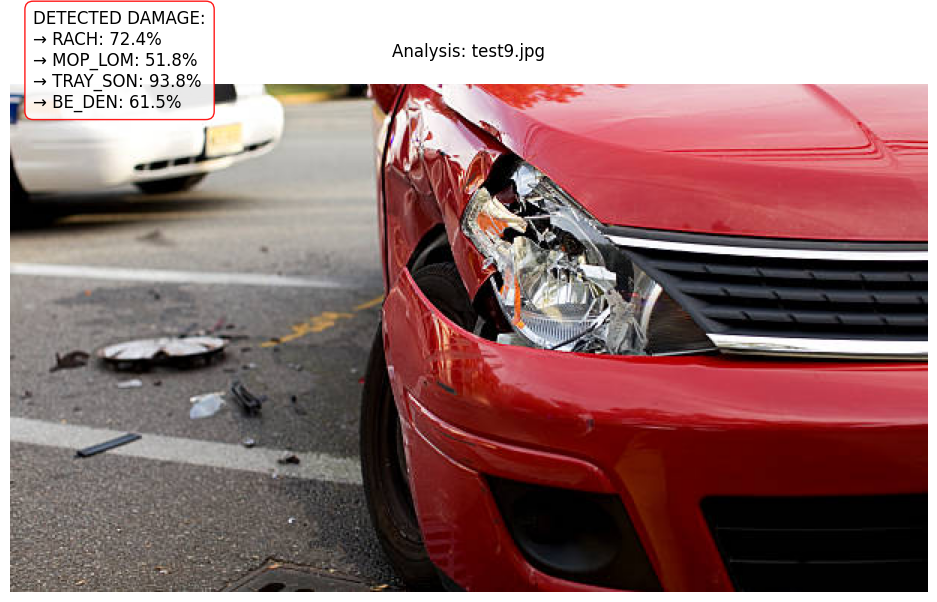


IMAGE: test9.jpg
DAMAGE FOUND:
- RACH: 72.4% confidence
- MOP_LOM: 51.8% confidence
- TRAY_SON: 93.8% confidence
- BE_DEN: 61.5% confidence


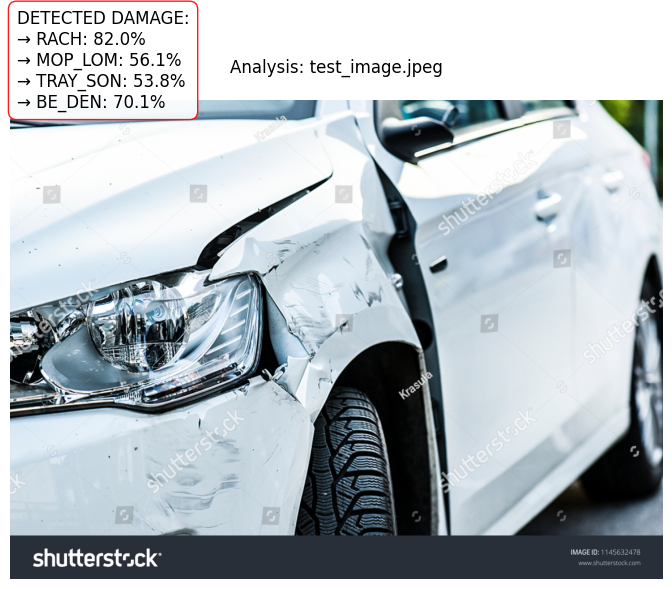


IMAGE: test_image.jpeg
DAMAGE FOUND:
- RACH: 82.0% confidence
- MOP_LOM: 56.1% confidence
- TRAY_SON: 53.8% confidence
- BE_DEN: 70.1% confidence


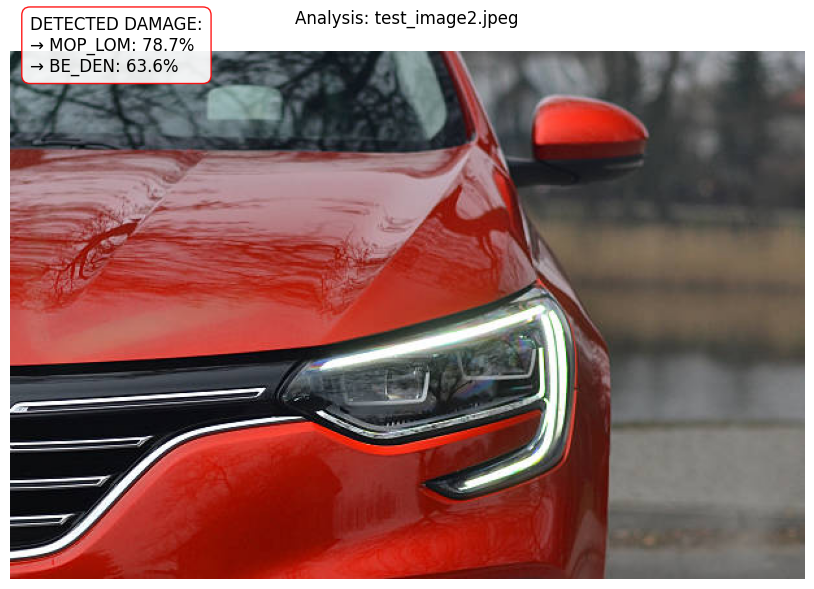


IMAGE: test_image2.jpeg
DAMAGE FOUND:
- MOP_LOM: 78.7% confidence
- BE_DEN: 63.6% confidence


In [ ]:
# Needed::

import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import os
import matplotlib.pyplot as plt

# --- Configuration ---
CLASSES = ['mat_bo_phan', 'rach', 'mop_lom', 'tray_son', 'thung', 'vo_kinh', 'be_den']
MODEL_PATH = '/kaggle/working/best_damage_model.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Model Definition (Must match training architecture) ---
class DamageNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.base = models.resnet50(weights=None)  # Weights will be loaded from state_dict
        in_features = self.base.fc.in_features
        self.base.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        return self.base(x)

def predict_test_images(test_dir, transform, threshold=0.5):
    # Load model with proper architecture
    model = DamageNet(len(CLASSES)).to(device)
    
    # Load checkpoint with weights_only=True for security
    # checkpoint = torch.load(MODEL_PATH, map_location=device, weights_only=True)
    checkpoint = torch.load(MODEL_PATH, map_location=device) #For TPU
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    # Get class mapping
    idx_to_class = {v: k for k, v in checkpoint['class_to_idx'].items()}
    
    # Process images
    image_files = [f for f in os.listdir(test_dir) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    for img_file in sorted(image_files):
        img_path = os.path.join(test_dir, img_file)
        try:
            # Load and process image
            img = Image.open(img_path).convert('RGB')
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            # Predict
            with torch.no_grad():
                outputs = model(img_tensor)
                probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            # Get predictions
            predictions = [(idx_to_class[i], float(p)) 
                         for i, p in enumerate(probs) if p > threshold]
            
            # Visualization
            plt.figure(figsize=(10, 6))
            plt.imshow(img)
            plt.axis('off')
            
            # Prepare annotation text
            if predictions:
                text = "DETECTED DAMAGE:\n" + "\n".join(
                    [f"→ {name.upper()}: {prob:.1%}" for name, prob in predictions])
            else:
                text = "No damage detected"
            
            # Add annotation
            plt.text(
                15, 15, text,
                fontsize=12,
                bbox=dict(
                    facecolor='white',
                    alpha=0.9,
                    edgecolor='red',
                    boxstyle='round,pad=0.5'
                ),
                color='black'
            )
            plt.title(f"Analysis: {img_file}", pad=20)
            plt.tight_layout()
            plt.show()
            
            # Console report
            print("\n" + "="*60)
            print(f"IMAGE: {img_file}")
            if predictions:
                print("DAMAGE FOUND:")
                for name, prob in predictions:
                    print(f"- {name.upper()}: {prob:.1%} confidence")
            else:
                print("STATUS: No significant damage detected")
            print("="*60)
            
        except Exception as e:
            print(f"\n⚠️ Error processing {img_file}: {str(e)}")
            continue

# Define transform (must match training transform)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Usage
predict_test_images('/kaggle/input/predictions/', transform, threshold=0.5)

In [ ]:
# Not needed::

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_data, batch_size=BATCH_SIZE)

# --- Model ---
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(CLASSES))

# --- Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# --- Training ---
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

best_val_loss = float('inf')
for epoch in range(EPOCHS):
    # Training
    model.train()
    train_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            val_loss += criterion(outputs, labels).item()
            
            preds = torch.sigmoid(outputs) > 0.5
            correct += (preds == labels).all(dim=1).sum().item()
    
    # Metrics
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    val_acc = correct / len(val_data)
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), '/kaggle/working/best_resnet_coco.pth')
    
    print(f'Epoch {epoch+1}/{EPOCHS} | '
          f'Train Loss: {train_loss:.4f} | '
          f'Val Loss: {val_loss:.4f} | '
          f'Val Acc: {val_acc:.4f}')

print("Training complete. Best model saved to '/kaggle/working/best_resnet_coco.pth'")

In [ ]:
# Not needed::

def predict_test_images(model, class_names, image_paths, img_size=(100, 100), threshold=0.5):
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    for img_path in image_paths:
        # Create new figure for each image
        plt.figure(figsize=(10, 6))
        
        # Load and preprocess image
        img = Image.open(img_path).convert('RGB')
        img_tensor = transform(img).unsqueeze(0).to(device)
        
        # Predict
        with torch.no_grad():
            outputs = model(img_tensor)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
        
        # Get predictions
        predictions = []
        for idx, prob in enumerate(probs):
            if prob > threshold:
                predictions.append((class_names[idx], prob))
        
        # Display image
        plt.imshow(img)
        plt.axis('off')
        
        # Prepare prediction text
        if predictions:
            text = "Predicted damages:\n"
            for name, prob in predictions:
                text += f"- {name}: {prob:.1%}\n"
        else:
            text = "No damage detected"
        
        # Add prediction text
        plt.text(
            10, 10, text,
            fontsize=12,
            bbox=dict(facecolor='white', alpha=0.8),
            color='red'
        )
        plt.title(os.path.basename(img_path))
        plt.show()
        
        # Print details in console
        print(f"\nImage: {os.path.basename(img_path)}")
        print("All class probabilities:")
        for name, prob in zip(class_names, probs):
            print(f"{name}: {prob:.1%}")
        print("-" * 50)

# Usage
test_images = [
    '/kaggle/input/predictions/test_image.jpeg',
    '/kaggle/input/predictions/test_image2.jpeg',
    '/kaggle/input/predictions/test3.jpg',
    '/kaggle/input/predictions/test4.jpg',
    '/kaggle/input/predictions/test5.jpg',
    '/kaggle/input/predictions/test7.jpg',
    '/kaggle/input/predictions/test8.jpg',
    '/kaggle/input/predictions/test9.jpg',
    '/kaggle/input/predictions/test11.jpg',
    '/kaggle/input/predictions/test12.jpg'
]
predict_test_images(model, list(CLASSES.keys()), test_images)

YOLO Preprocessing - Annotations:

In [ ]:
# Needed::

# Convert Polygon to Yolo annotations directly::

# Define class mapping (0-based index for YOLO)
CLASSES = {
    'mat_bo_phan': 0,
    'rach': 1,
    'mop_lom': 2,
    'tray_son': 3,
    'thung': 4,
    'vo_kinh': 5,
    'be_den': 6
}

def convert_and_save_annotations(image_dir, annotation_json, output_label_dir):
    # Ensure output directory exists
    os.makedirs(output_label_dir, exist_ok=True)

    with open(annotation_json) as f:
        annotations = json.load(f)

    for img_name, img_data in annotations.items():
        img_path = os.path.join(image_dir, img_name)
        label_path = os.path.join(output_label_dir, os.path.splitext(img_name)[0] + '.txt')

        # Skip if image doesn't exist
        if not os.path.exists(img_path):
            continue

        try:
            with Image.open(img_path) as img:
                img_w, img_h = img.size
        except:
            continue  # Skip corrupted images

        lines = []

        for region in img_data.get("regions", []):
            all_x = region["all_x"]
            all_y = region["all_y"]
            class_name = region["class"]

            if class_name not in CLASSES:
                continue

            # Bounding box from polygon
            x_min = min(all_x)
            y_min = min(all_y)
            w = max(all_x) - x_min
            h = max(all_y) - y_min

            x_center = np.clip((x_min + w / 2) / img_w, 0, 1)
            y_center = np.clip((y_min + h / 2) / img_h, 0, 1)
            w_norm = np.clip(w / img_w, 0, 1)
            h_norm = np.clip(h / img_h, 0, 1)


            class_id = CLASSES[class_name]
            lines.append(f"{class_id} {x_center} {y_center} {w_norm} {h_norm}")

        # Save annotations only if there’s at least one valid region
        if lines:
            with open(label_path, "w") as f:
                f.write("\n".join(lines))

    print(f"Saved annotations to: {output_label_dir}")

# ==== Apply for both train and val ====

# Train
convert_and_save_annotations(
    image_dir='/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image',
    annotation_json='/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Train_via_annos.json',
    output_label_dir='/kaggle/working/yolo_dataset/labels/train'
)

# Val
convert_and_save_annotations(
    image_dir='/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation',
    annotation_json='/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/0Val_via_annos.json',
    output_label_dir='/kaggle/working/yolo_dataset/labels/validation'
)

Saved annotations to: /kaggle/working/yolo_dataset/labels/train
Saved annotations to: /kaggle/working/yolo_dataset/labels/validation


In [ ]:
# Needed

import shutil
import os

def copy_images(src_dir, dst_dir):
    os.makedirs(dst_dir, exist_ok=True)
    for fname in os.listdir(src_dir):
        if fname.lower().endswith((".jpg", ".jpeg", ".png")):
            shutil.copy(os.path.join(src_dir, fname), os.path.join(dst_dir, fname))

# Copy train images
copy_images(
    src_dir="/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image",
    dst_dir="/kaggle/working/yolo_dataset/images/train"
)

# Copy val images
copy_images(
    src_dir="/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation",
    dst_dir="/kaggle/working/yolo_dataset/images/validation"
)

In [ ]:
# Not needed::

# This part is not needed for YOLO ::
import json
import pandas as pd

with open("train_coco.json") as f:
    coco_data = json.load(f)

id_to_image = {img["id"]: img for img in coco_data["images"]}

rows = []
for ann in coco_data["annotations"]:
    img_id = ann["image_id"]
    img_info = id_to_image[img_id]
    
    # Normalize COCO bbox [x,y,w,h] → YOLO [x_center, y_center, w, h]
    x, y, w, h = ann["bbox"]
    x_center = round((x + w / 2) / img_info["width"], 2)  # Rounded to 2 decimal places
    y_center = round((y + h / 2) / img_info["height"], 2)
    w_norm = round(w / img_info["width"], 2)
    h_norm = round(h / img_info["height"], 2)
    
    rows.append([
        img_info["file_name"],  # image_path
        ann["category_id"] - 1,  # class_id (0-based)
        x_center, y_center, w_norm, h_norm
    ])

df = pd.DataFrame(rows, columns=["image_path", "class_id", "x_center", "y_center", "width", "height"])
df.to_csv("train_annotations_yolo.csv", index=False)



with open("val_coco.json") as f:
    coco_data = json.load(f)

id_to_image = {img["id"]: img for img in coco_data["images"]}

rows = []
for ann in coco_data["annotations"]:
    img_id = ann["image_id"]
    img_info = id_to_image[img_id]
    
    # Normalize COCO bbox [x,y,w,h] → YOLO [x_center, y_center, w, h]
    x, y, w, h = ann["bbox"]
    x_center = round((x + w / 2) / img_info["width"], 2)  # Rounded to 2 decimal places
    y_center = round((y + h / 2) / img_info["height"], 2)
    w_norm = round(w / img_info["width"], 2)
    h_norm = round(h / img_info["height"], 2)
    
    rows.append([
        img_info["file_name"],  # image_path
        ann["category_id"] - 1,  # class_id (0-based)
        x_center, y_center, w_norm, h_norm
    ])

df = pd.DataFrame(rows, columns=["image_path", "class_id", "x_center", "y_center", "width", "height"])
df.to_csv("val_annotations_yolo.csv", index=False)

FileNotFoundError: [Errno 2] No such file or directory: 'train_coco.json'

In [ ]:
# Needed::

# This part is not needed for YOLO ::

import os
import pandas as pd
from tqdm import tqdm

# Load CSV annotations
df = pd.read_csv("train_annotations_yolo.csv")

# Create YOLO directory structure
os.makedirs("yolo_dataset/images/train", exist_ok=True)
os.makedirs("yolo_dataset/labels/train", exist_ok=True)

# Group by image and save as TXT files
for img_path, group in tqdm(df.groupby('image_path')):
    # Get base filename without extension
    base_name = os.path.splitext(os.path.basename(img_path))[0]
    
    # Create label file path
    txt_path = f"yolo_dataset/labels/train/{base_name}.txt"
    
    # Write all annotations for this image
    with open(txt_path, 'w') as f:
        for _, row in group.iterrows():
            line = f"{int(row['class_id'])} {row['x_center']:.6f} {row['y_center']:.6f} {row['width']:.6f} {row['height']:.6f}\n"
            f.write(line)
    
    # Copy image to YOLO directory (assuming original images exist)
    os.system(f"cp '{os.path.join('/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image', img_path)}' 'yolo_dataset/images/train/{os.path.basename(img_path)}'")

In [ ]:
# Needed::

# This part is not needed for YOLO ::

# Load CSV annotations
df = pd.read_csv("val_annotations_yolo.csv")

# Create YOLO directory structure
os.makedirs("yolo_dataset/images/validation", exist_ok=True)
os.makedirs("yolo_dataset/labels/validation", exist_ok=True)

# Group by image and save as TXT files
for img_path, group in tqdm(df.groupby('image_path')):
    # Get base filename without extension
    base_name = os.path.splitext(os.path.basename(img_path))[0]
    
    # Create label file path
    txt_path = f"yolo_dataset/labels/validation/{base_name}.txt"
    
    # Write all annotations for this image
    with open(txt_path, 'w') as f:
        for _, row in group.iterrows():
            line = f"{int(row['class_id'])} {row['x_center']:.6f} {row['y_center']:.6f} {row['width']:.6f} {row['height']:.6f}\n"
            f.write(line)
    
    # Copy image to YOLO directory (assuming original images exist)
    os.system(f"cp '{os.path.join('/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation', img_path)}' 'yolo_dataset/images/validation/{os.path.basename(img_path)}'")

In [ ]:
# Needed::

# Visualize images

import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image

# Reverse class mapping
CLASS_NAMES = {
    0: 'mat_bo_phan',
    1: 'rach',
    2: 'mop_lom',
    3: 'tray_son',
    4: 'thung',
    5: 'vo_kinh',
    6: 'be_den'
}

def visualize_yolo_annotations(image_dir, label_dir, num_samples=3):
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(".jpg")]
    sampled_files = random.sample(image_files, num_samples)

    for img_name in sampled_files:
        img_path = os.path.join(image_dir, img_name)
        label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + '.txt')

        # Load image
        image = Image.open(img_path).convert("RGB")
        img_w, img_h = image.size

        # Plot image
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')

        # Draw boxes from YOLO label
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue

                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])

                # Convert from YOLO to pixel coordinates
                x = (x_center - width / 2) * img_w
                y = (y_center - height / 2) * img_h
                w = width * img_w
                h = height * img_h

                # Draw rectangle
                rect = patches.Rectangle(
                    (x, y), w, h,
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none'
                )
                plt.gca().add_patch(rect)

                # Draw label
                label = CLASS_NAMES.get(class_id, str(class_id))
                plt.text(
                    x + w / 2, y - 10 if y > 20 else y + h + 15,
                    label,
                    color='white',
                    fontsize=10,
                    ha='center',
                    bbox=dict(facecolor='red', alpha=0.7)
                )

        plt.title(f"Image: {img_name}")
        plt.tight_layout()
        plt.show()

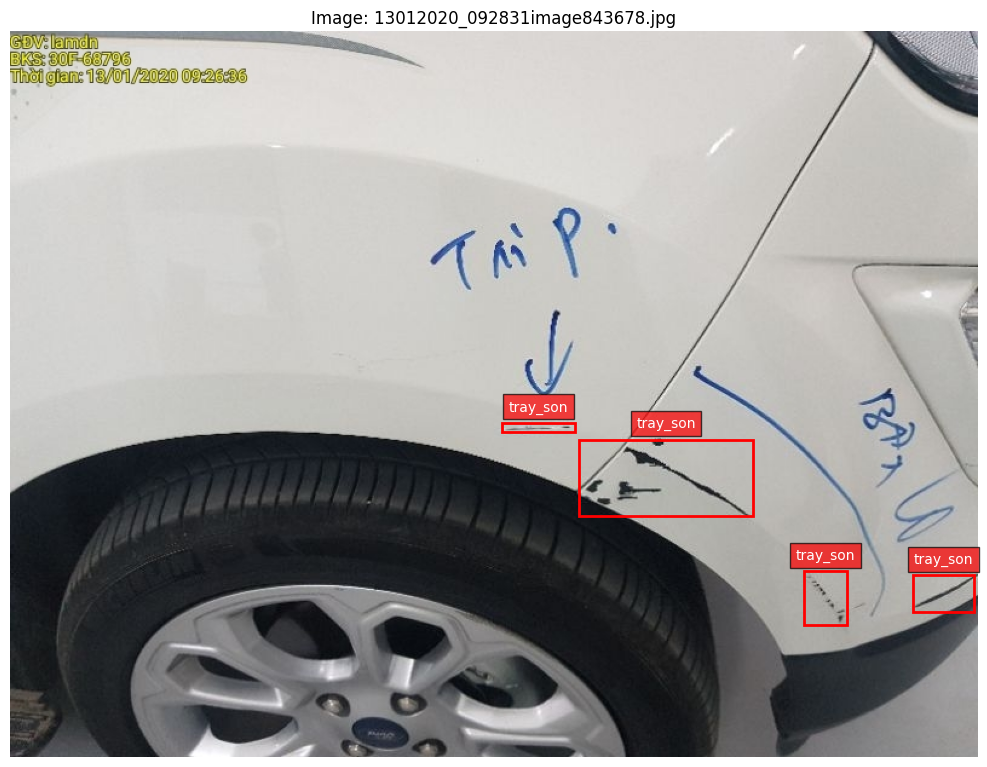

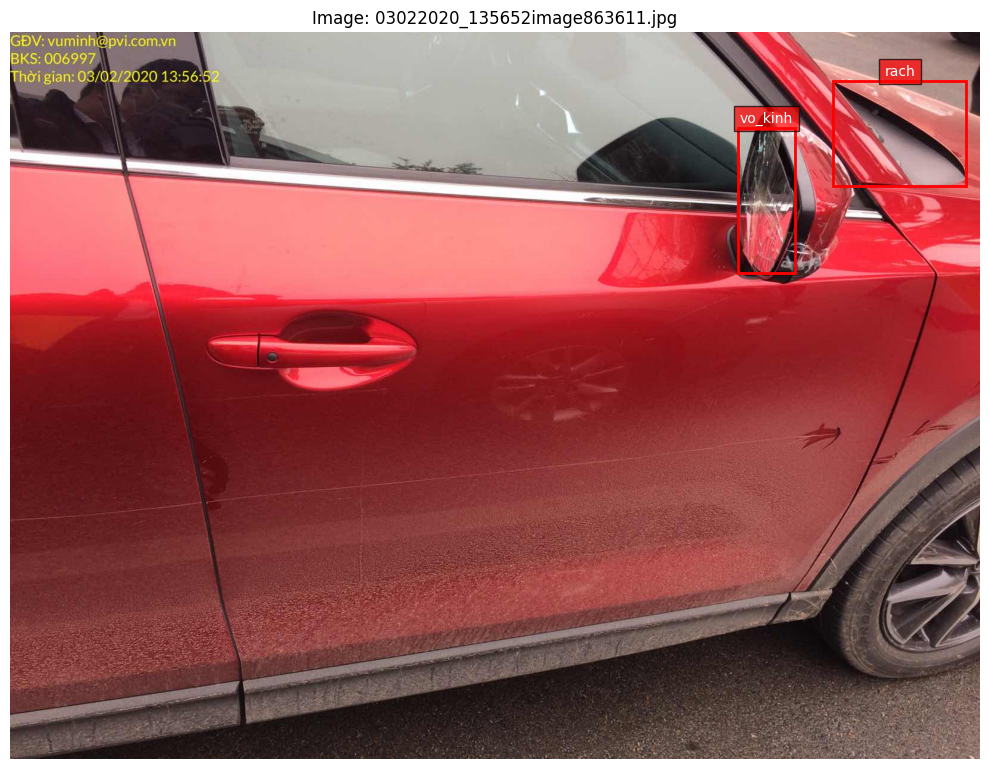

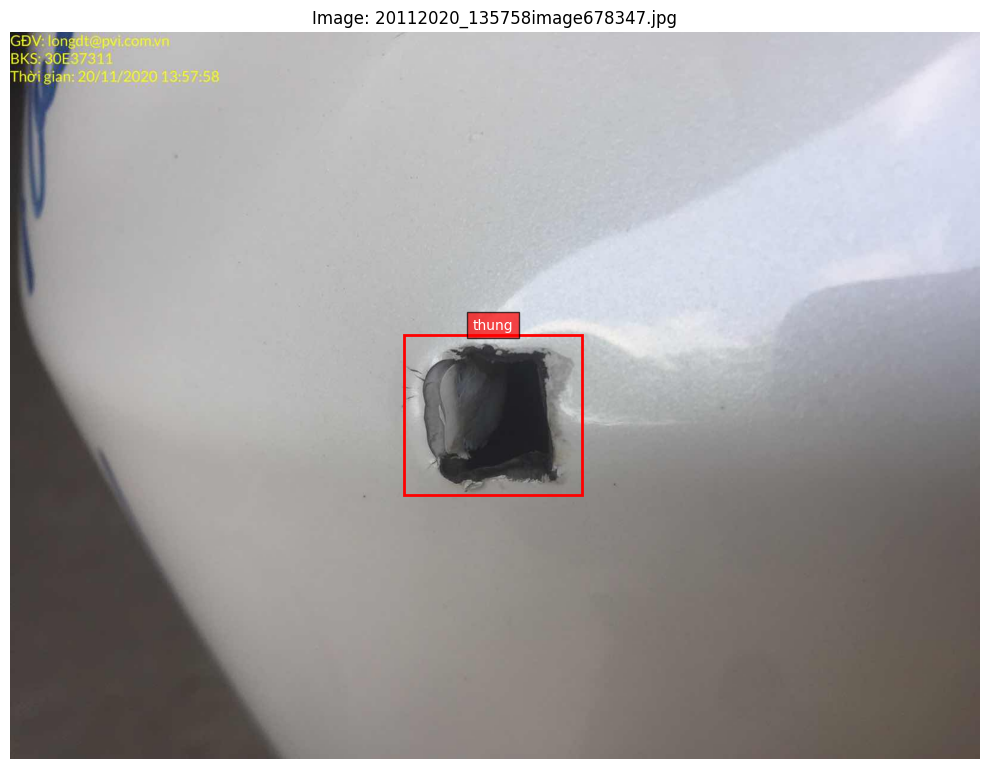

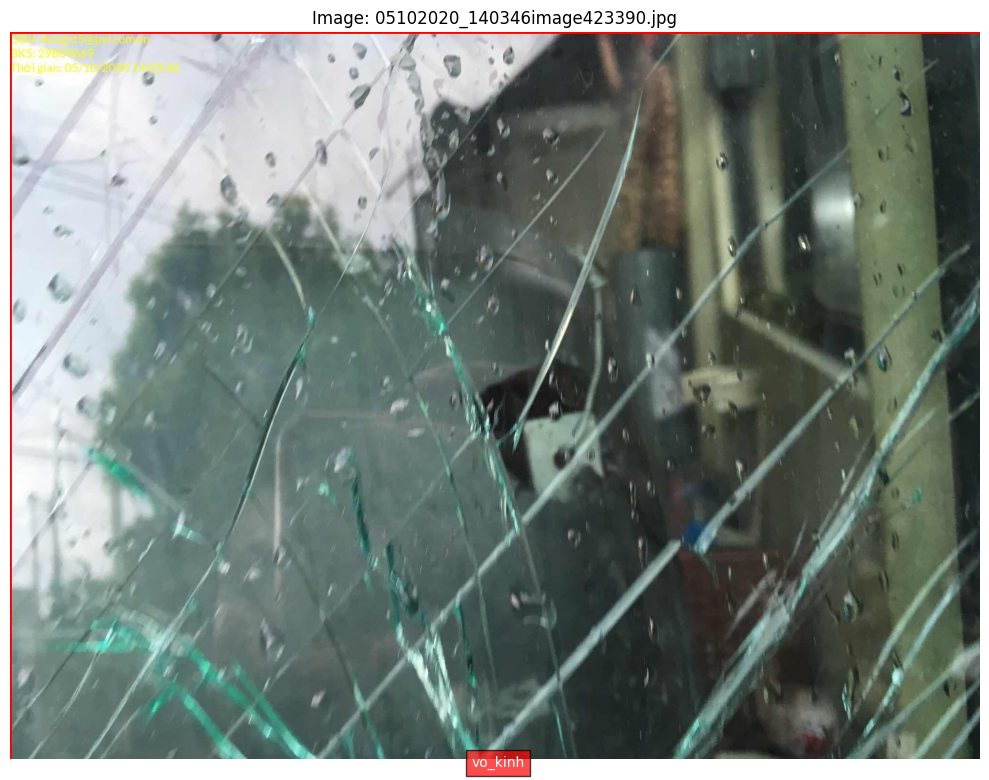

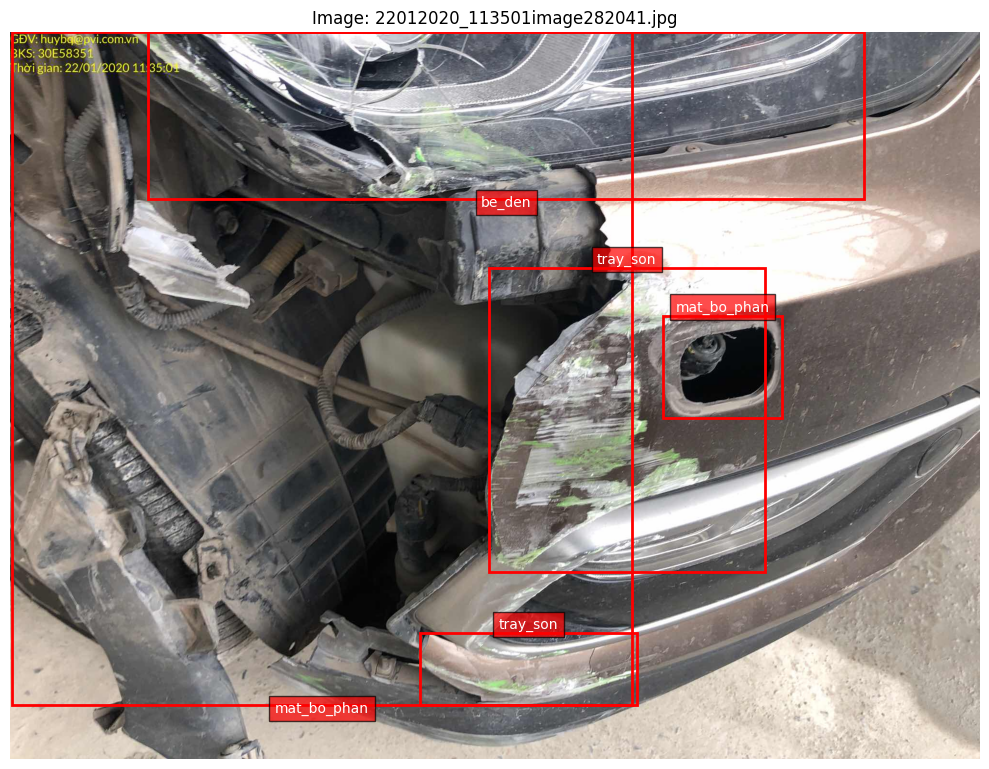

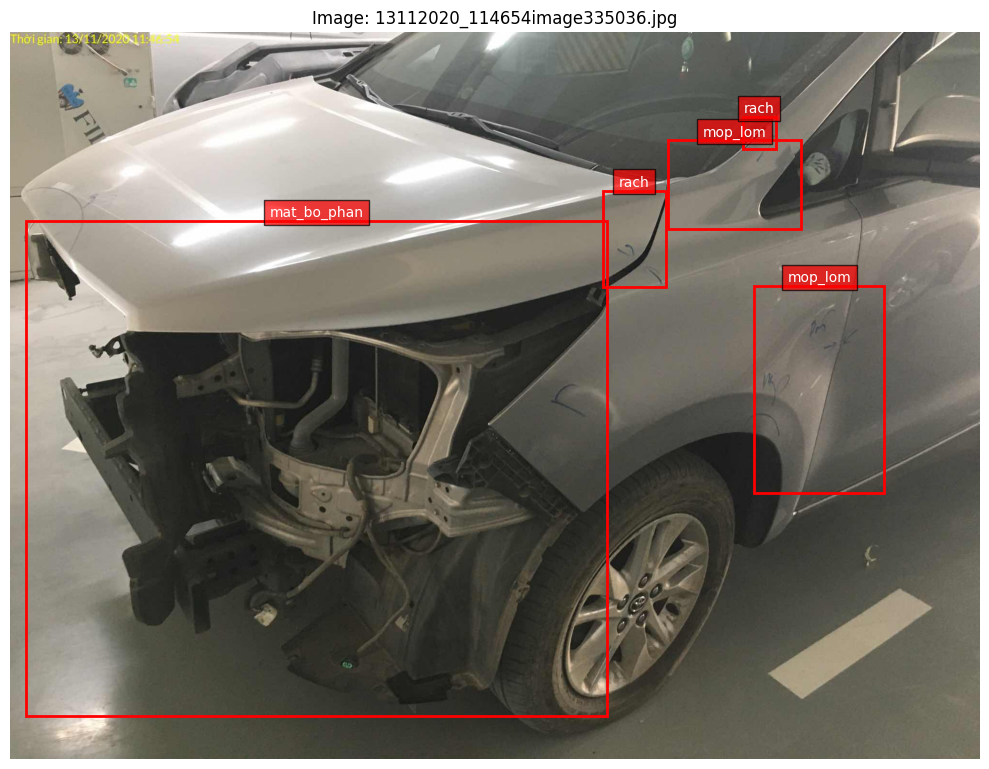

In [ ]:
# Needed::

# For train set
visualize_yolo_annotations(
    image_dir="/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/image/image",
    label_dir="/kaggle/working/yolo_dataset/labels/train",
    num_samples=3
)

# For val set
visualize_yolo_annotations(
    image_dir="/kaggle/input/vehide-dataset-automatic-vehicle-damage-detection/validation/validation",
    label_dir="/kaggle/working/yolo_dataset/labels/validation",
    num_samples=3
)

In [ ]:
# Needed::

!pip install ultralytics pyyaml --quiet
import ultralytics
ultralytics.checks()

Ultralytics 8.3.107 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6277.7/8062.4 GB disk)


In [ ]:
# Needed::

from ultralytics import YOLO
import os

# Verify dataset structure
print("Dataset structure:")
!tree -d /kaggle/working/yolo_dataset

# Create dataset.yaml (with 'validation' instead of 'val')
yaml_content = """
path: /kaggle/working/yolo_dataset
train: images/train
validation: images/validation  # Updated to use 'validation'

names: 
  0: mat_bo_phan
  1: rach
  2: mop_lom
  3: tray_son
  4: thung
  5: vo_kinh
  6: be_den

nc: 7
"""

with open('/kaggle/working/dataset.yaml', 'w') as f:
    f.write(yaml_content.strip())

# Verify YAML
!cat /kaggle/working/dataset.yaml

# Initialize model (choose one)
# model = YOLO('yolov8n.pt')  # Nano (fastest)
# model = YOLO('yolov8s.pt')  # Small
model = YOLO('yolov8m.pt')  # Medium
# model = YOLO('yolov8l.pt')  # Large
# model = YOLO('yolov8x.pt')  # XLarge (most accurate)

# Training parameters optimized for Kaggle
results = model.train(
    data='/kaggle/working/dataset.yaml',
    epochs=100,
    batch=32,  # Reduce if OOM errors occur
    imgsz=640,
    device='0',  # Use GPU
    workers=4,  # Kaggle limits CPU threads
    single_cls=False,
    optimizer='SGD',  # Better than SGD for small datasets
    lr0=0.005,
    cos_lr=True,  # Cosine LR scheduler
    overlap_mask=True,
    augment=True,
    patience=20,  # Early stopping
    pretrained=True,
    verbose=True,
    
    # Kaggle-specific optimizations
    exist_ok=True,  # Overwrite existing files
    project='/kaggle/working/yolo_results',
    name='damage_detection',
    save_period=20  # Save every 5 epochs
)

# Save best model
best_model_path = '/kaggle/working/best_damage_detection.pt'
model.export(format='onnx')  # Optional: Export to ONNX
!cp {results.save_dir}/weights/best.pt {best_model_path}
print(f"Best model saved to: {best_model_path}")

# Verify results
!ls -lh /kaggle/working/yolo_results/damage_detection

Dataset structure:
/bin/bash: line 1: tree: command not found
path: /kaggle/working/yolo_dataset
train: images/train
validation: images/validation  # Updated to use 'validation'

names: 
  0: mat_bo_phan
  1: rach
  2: mop_lom
  3: tray_son
  4: thung
  5: vo_kinh
  6: be_den

nc: 7Downloading https://github.com/ultralytics/assets/releases/download/v8.3.0/yolov8m.pt to 'yolov8m.pt'...


100%|██████████| 49.7M/49.7M [00:00<00:00, 185MB/s]


Ultralytics 8.3.107 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/dataset.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=640, save=True, save_period=20, cache=False, device=0, workers=4, project=/kaggle/working/yolo_results, name=damage_detection, exist_ok=True, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/yolo_dataset/labels/train... 11607 images, 0 backgrounds, 329 corrupt: 100%|██████████| 11621/11621 [00:10<00:00, 1095.29it/s]

train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01042020_091440image496933.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0025]
train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01102020_111014image486727.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0012]
train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01102020_111019image24047.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0012]
train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01102020_111038image291215.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0018]
train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01102020_135257image420525.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0067]
train: WARNING ⚠️ /kaggle/working/yolo_dataset/images/train/01112020_083504image543142.jpg: ignoring 

train: New cache created: /kaggle/working/yolo_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/yolo_dataset/labels/validation... 2322 images, 0 backgrounds, 72 corrupt: 100%|██████████| 2324/2324 [00:03<00:00, 723.34it/s]

val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/01042020_091351image21145.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0037]
val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/01102020_135233image760694.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0267]
val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/02012020_082149image965429.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0017]
val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/02012020_095611image737458.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0035]
val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/02012020_095705image758065.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0015]
val: WARNING ⚠️ /kaggle/working/yolo_dataset/images/validation/02022020_093105image439

val: New cache created: /kaggle/working/yolo_dataset/labels/validation.cache
Plotting labels to /kaggle/working/yolo_results/damage_detection/labels.jpg... 
optimizer: SGD(lr=0.005, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/yolo_results/damage_detection
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      13.9G       1.64      3.282      1.759        170        640: 100%|██████████| 353/353 [06:35<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:26<00:00,  1.38it/s]


                   all       2252       5914      0.338      0.284      0.251      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100        14G      1.469       2.36      1.599        140        640: 100%|██████████| 353/353 [06:33<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.45it/s]


                   all       2252       5914      0.386      0.337       0.29      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        14G      1.517      2.322      1.632        161        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:25<00:00,  1.43it/s]


                   all       2252       5914      0.317      0.276      0.229      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100        14G      1.612      2.465      1.706        157        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.355      0.297      0.261      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100        14G       1.59      2.408      1.697        162        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914       0.39      0.312      0.284      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        14G      1.549      2.313      1.665        137        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.417      0.343      0.316       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100        14G      1.531       2.26      1.649        137        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.409      0.359       0.33      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100        14G      1.503      2.207      1.631        114        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.439      0.354      0.337      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100        14G      1.471      2.148      1.607        140        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.485      0.355      0.358      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100        14G      1.462      2.124      1.606        149        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.447      0.354      0.344      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100        14G      1.443      2.077      1.583        189        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.485      0.385      0.379      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100        14G      1.434      2.044      1.572        191        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.474      0.393      0.379      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100        14G      1.421      2.017      1.563        145        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.494        0.4      0.396      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100        14G        1.4      1.977       1.55        118        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.45it/s]


                   all       2252       5914      0.495      0.401      0.393      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100        14G      1.392      1.953      1.542        120        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.508      0.423      0.416      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100        14G      1.372      1.904      1.529        130        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.509      0.402      0.402      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100        14G      1.358      1.872      1.517        122        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.498      0.431      0.422       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100        14G      1.347      1.845      1.502        162        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.529      0.422      0.424      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100        14G       1.34      1.829      1.501        135        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.532      0.441      0.441      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100        14G      1.323      1.803      1.485        117        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.524       0.44      0.437      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100        14G      1.315      1.784      1.485        130        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.517      0.459      0.453      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100        14G      1.308      1.739      1.472        119        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.46it/s]


                   all       2252       5914      0.542      0.439       0.45      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100        14G      1.292      1.709      1.458        165        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.517      0.446      0.449      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100        14G       1.28       1.69      1.452        173        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.563      0.455      0.469      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100        14G       1.27      1.659      1.443         99        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.565      0.456      0.464      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100        14G      1.265      1.641      1.439        156        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.546      0.464      0.467      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100        14G       1.25      1.617      1.422        151        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.573      0.465      0.473      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100        14G      1.251      1.598       1.42        174        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.583       0.46      0.478      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100        14G      1.227      1.563      1.406        137        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.47it/s]


                   all       2252       5914      0.604      0.458      0.485      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100        14G      1.221       1.54      1.402        140        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.556      0.472      0.477      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100        14G      1.209      1.512      1.387        160        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.567      0.473      0.482      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100        14G      1.203      1.495      1.383        137        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.50it/s]


                   all       2252       5914      0.564      0.496      0.488      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100        14G      1.187      1.464      1.372        146        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.582      0.478      0.486      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100        14G      1.174      1.439      1.359        152        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.575      0.489      0.488      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100        14G      1.165      1.423      1.355        136        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.584      0.484      0.496      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100        14G      1.165      1.409       1.35        156        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.607      0.479      0.497      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100        14G      1.153      1.387      1.348        156        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.618      0.475      0.501       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        14G      1.142      1.355      1.333        151        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.613      0.474      0.498      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100        14G      1.139      1.346      1.332        147        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.593      0.492      0.505      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100        14G      1.126      1.313      1.317        135        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.617      0.486      0.508      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100        14G      1.115      1.298      1.314        171        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.585      0.505       0.51      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100        14G      1.109      1.266      1.307        122        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.50it/s]


                   all       2252       5914      0.598      0.496      0.506      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100        14G      1.093      1.248      1.296        131        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.595      0.495      0.503      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100        14G      1.084      1.228      1.289        141        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.50it/s]


                   all       2252       5914      0.613      0.491      0.507      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100        14G      1.078      1.204      1.281        140        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.619      0.499      0.516      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100        14G      1.069      1.191      1.274        114        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.625      0.498      0.512      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100        14G      1.061      1.177      1.271        137        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.617        0.5      0.512      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100        14G      1.058      1.152      1.266        132        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.50it/s]


                   all       2252       5914      0.615      0.495      0.511      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100        14G      1.053      1.151      1.262        147        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.50it/s]


                   all       2252       5914      0.615      0.496      0.508      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100        14G       1.03      1.113      1.248        127        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.633      0.489      0.512      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100        14G      1.018      1.081      1.233        115        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914       0.63      0.487       0.51      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100        14G      1.017      1.072      1.235        131        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.606      0.503      0.515      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100        14G      1.004      1.063      1.228        179        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.621      0.499       0.51       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100        14G     0.9998       1.05      1.226        145        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.633      0.493      0.515      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100        14G     0.9889      1.027      1.211        141        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.637      0.494      0.511      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100        14G      0.978      1.016      1.204        127        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.50it/s]


                   all       2252       5914      0.621        0.5       0.51       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        14G     0.9784      1.002      1.207        133        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.48it/s]


                   all       2252       5914      0.638      0.493      0.512       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100        14G     0.9647     0.9774      1.192        135        640: 100%|██████████| 353/353 [06:32<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.50it/s]


                   all       2252       5914      0.623      0.501      0.513      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100        14G      0.959     0.9678      1.191        128        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914       0.61      0.507       0.51      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100        14G     0.9506     0.9484      1.183        150        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.626      0.497       0.51       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100        14G       0.95     0.9433      1.182        120        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.52it/s]


                   all       2252       5914      0.631      0.496      0.511      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100        14G     0.9376     0.9202      1.175        151        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.50it/s]


                   all       2252       5914      0.638      0.496      0.513      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100        14G     0.9312      0.918       1.17        123        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.647      0.495      0.512      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100        14G     0.9193     0.9026      1.166        117        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.644      0.494      0.509      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100        14G     0.9109     0.8827      1.158        161        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.642       0.49      0.508      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100        14G     0.9048     0.8711      1.151        119        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.626      0.497      0.509      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100        14G     0.8976     0.8616      1.147        149        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.612      0.506      0.507      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100        14G     0.8917     0.8455      1.141        139        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.50it/s]


                   all       2252       5914      0.607      0.508      0.506      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100        14G     0.8845     0.8398      1.137        171        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.633      0.494      0.506      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100        14G     0.8801     0.8248      1.134        132        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:24<00:00,  1.49it/s]


                   all       2252       5914      0.631      0.496      0.508      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100        14G     0.8685     0.8139      1.129        154        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.623      0.503      0.509      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100        14G     0.8587     0.7939      1.123        148        640: 100%|██████████| 353/353 [06:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:23<00:00,  1.51it/s]


                   all       2252       5914      0.631      0.501      0.507      0.328
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 52, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

72 epochs completed in 8.347 hours.
Optimizer stripped from /kaggle/working/yolo_results/damage_detection/weights/last.pt, 52.0MB
Optimizer stripped from /kaggle/working/yolo_results/damage_detection/weights/best.pt, 52.0MB

Validating /kaggle/working/yolo_results/damage_detection/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,843,813 parameters, 0 gradients, 78.7 GFLOPs
WARNING ⚠️ renaming data YAML 'validation' key to 'val' to match YOLO format.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:49<00:00,  1.38s/it]


                   all       2252       5914      0.633      0.493      0.521      0.345
           mat_bo_phan        396        442       0.75      0.658      0.702      0.534
                  rach        652        954      0.503      0.362      0.349      0.217
               mop_lom        738        957      0.507      0.326       0.33      0.168
              tray_son       1115       2333      0.501      0.305      0.327      0.187
                 thung        316        415      0.653      0.487      0.502      0.309
               vo_kinh        342        358      0.809      0.743      0.819      0.629
                be_den        403        455      0.708      0.571      0.617      0.375


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 18.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/working/yolo_results/damage_detection
Ultralytics 8.3.107 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 92 layers, 25,843,813 parameters, 0 gradients, 78.7 GFLOPs

PyTorch: starting from '/kaggle/working/yolo_results/damage_detection/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (49.6 MB)
requirements: Ultralytics requirements ['onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.8/280.8 MB 170.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 261.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 311.8 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 11.3s, installed 2 packages: ['onnxslim', 'onnxruntime-g

In [ ]:
# Needed::

import glob
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 1. Load your trained model
model = YOLO('/kaggle/working/best_damage_detection.pt')  # Update path to your trained weights

# 2. Get all images from prediction folder
image_paths = glob.glob('/kaggle/input/predictions/*.jpg') + \
              glob.glob('/kaggle/input/predictions/*.jpeg') + \
              glob.glob('/kaggle/input/predictions/*.png')

# 3. Class names (must match your training)
class_names = {
    0: 'mat_bo_phan',
    1: 'rach',
    2: 'mop_lom',
    3: 'tray_son',
    4: 'thung',
    5: 'vo_kinh',
    6: 'be_den'
}

# 4. Prediction and visualization function
def predict_and_visualize(image_path, conf_threshold=0.25):
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    orig_image = image.copy()
    
    # Run prediction
    results = model(image, conf=conf_threshold)
    
    # Create plot
    plt.figure(figsize=(12, 8))
    plt.imshow(orig_image)
    
    # Process results
    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        class_ids = result.boxes.cls.cpu().numpy().astype(int)
        
        for box, conf, class_id in zip(boxes, confs, class_ids):
            x1, y1, x2, y2 = map(int, box)
            
            # Draw bounding box
            plt.gca().add_patch(plt.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                fill=False, edgecolor='red', linewidth=2, alpha=0.8
            ))
            
            # Label with class and confidence
            label = f"{class_names[class_id]}: {conf:.2f}"
            plt.text(
                x1, y1-10, label,
                color='white', fontsize=10,
                bbox=dict(facecolor='red', alpha=0.8, edgecolor='none')
            )
    
    plt.axis('off')
    plt.title(f"Predictions: {image_path.split('/')[-1]}")
    plt.show()
    
    # Print detailed results
    print(f"\nFile: {image_path}")
    for class_id in class_names:
        class_mask = class_ids == class_id
        if any(class_mask):
            print(f"{class_names[class_id]}:")
            for conf in confs[class_mask]:
                print(f"  - Confidence: {conf:.2f}")

# 5. Run predictions on all images
for img_path in image_paths:
    predict_and_visualize(img_path)

SyntaxError: unexpected character after line continuation character (<ipython-input-10-b21854512188>, line 11)